<a href="https://colab.research.google.com/github/KazGet/Pet-and-educational-projects/blob/main/Black_Sholes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 3.3 MB/s eta 0:00:00


In [2]:
import numpy as np
from deap import base, creator, tools, algorithms
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import random
from scipy.optimize import minimize
from scipy.stats import norm
from scipy.optimize import basinhopping

ГА Волновое уравнение

Примеры и ответы для уравнений:

1) Стандартное волновое уравнение

Граничные условия: u(0, t) = u(Pi, t) = 0

Начальные условия: u(x, 0) = Sin(x);  u_t(x, 0) = 0

Аналитическое решение: u(x, t) = sin(x)*cos(ct)

Коэффициенты: A1 ≈ 1; остальные A(k), B(k) ≈ 0

2) Волна с начальной скоростью (ненулевая ∂u/∂t)

Граничные условия:u(0,t) = u(π,t)=0

Начальные условия:u(x,0) = sin(2x); u_t(x, 0) = 0

Аналитическое решение: sin(2x)sin(2ct)

Коэффициенты: B2 ≈ 1/2c; остальные A(k), B(k) ≈ 0

3) Двухмодовая волна (суперпозиция гармоник)

Граничные условия: u(0,t)=u(π,t)=0

Начальные условия: u(x,0)=0.5sin(x)+0.3sin(3x);  ∂u/∂t(x,0)=0

Аналитическое решение: u(x,t)=0.5sin(x)cos(ct)+0.3sin(3x)cos(3ct)

Код должен найти A1≈0.5, A3≈0.3, остальные Ak, Bk ≈0.

gen	nevals	avg    	min    
0  	200   	587.908	74.3848
1  	150   	419.345	74.3848
2  	137   	262.469	26.0786
3  	162   	175.218	26.0345
4  	144   	115.251	22.1612
5  	169   	73.4509	12.1606
6  	162   	47.9379	8.58801
7  	156   	33.6078	5.15231
8  	164   	25.4845	4.83492
9  	146   	17.3925	3.44986
10 	157   	12.0611	1.94222
11 	162   	8.41982	1.16186
12 	158   	5.726  	1.09724
13 	153   	4.22709	0.782029
14 	141   	2.44895	0.523836
15 	150   	2.13292	0.356755
16 	157   	1.86136	0.239284
17 	172   	1.76895	0.114587
18 	160   	1.05891	0.0842763
19 	153   	1.16804	0.0842763
20 	151   	0.83012	0.0594887
21 	157   	1.58315	0.058825 
22 	154   	0.326833	0.0361869
23 	156   	0.780171	0.0217653
24 	148   	1.10729 	0.00816124
25 	154   	0.892802	0.00907678
26 	153   	0.919408	0.00811428
27 	154   	0.793033	0.00626195
28 	140   	0.683594	0.00257843
29 	156   	0.71233 	0.00198745
30 	150   	0.870081	0.00127859
31 	148   	0.555159	0.00122826
32 	151   	0.527302	0.000882291
33 	148   	0.419284	0.0003

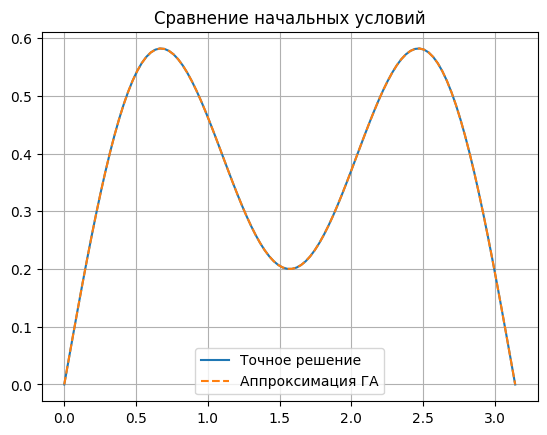

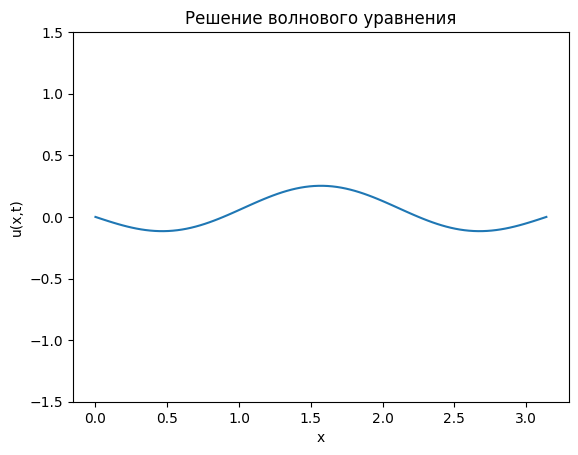

In [3]:
# @title Волновое уравнение
L = np.pi               # Длина струны
c = 1.0                 # Скорость волны
N_TERMS = 4             # Количество гармоник
TIME_END = 5.0          # Время моделирования
N_POINTS = 100          # Число точек по пространству

POP_SIZE = 200
NGEN = 100
CXPB = 0.7
MUTPB = 0.2
BOUND_LOW, BOUND_UP = -1.0, 1.0

# Начальные условия
def initial_u(x):
  # Уберите комментарий, чтобы использовать необходимые начальные условия
    # return np.sin(x)
    # return np.sin(2*x)
    return 0.5*np.sin(x)+0.3*np.sin(3*x)

def initial_v(x):
    return 0.0

# Форма решения
def solution_form(x, t, individual):
    u = 0.0
    for k in range(1, N_TERMS + 1):
        A_k = individual[2 * k - 2]
        B_k = individual[2 * k - 1]
        omega_k = c * k * np.pi / L
        u += (A_k * np.cos(omega_k * t) + B_k * np.sin(omega_k * t)) * np.sin(k * np.pi * x / L)
    return u

# Функция приспособленности
def evaluate(individual):
    error = 0.0
    x_points = np.linspace(0, L, N_POINTS)
    delta_t = 1e-3

    for x in x_points:
        u0 = solution_form(x, 0, individual)
        error += (u0 - initial_u(x)) ** 2

        u1 = solution_form(x, delta_t, individual)
        v_approx = (u1 - u0) / delta_t
        error += (v_approx - initial_v(x)) ** 2

    return (error,)

creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

toolbox = base.Toolbox()
toolbox.register("attr_float", np.random.uniform, BOUND_LOW, BOUND_UP)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=2 * N_TERMS)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

toolbox.register("evaluate", evaluate)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.1, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

pop = toolbox.population(n=POP_SIZE)
hof = tools.HallOfFame(1)
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

algorithms.eaSimple(pop, toolbox, cxpb=CXPB, mutpb=MUTPB, ngen=NGEN, stats=stats, halloffame=hof)

best_individual = hof[0]
print("\n--- Результаты ---")
print(f"Лучшая ошибка: {best_individual.fitness.values[0]:.3e}")

# Коэффициенты
print("\nКоэффициенты:")
for k in range(1, N_TERMS + 1):
    A_k = best_individual[2*k - 2]
    B_k = best_individual[2*k - 1]
    print(f"k = {k}: A_k = {A_k:.5f}, B_k = {B_k:.5f}")

# Проверка начального условия
x = np.linspace(0, L, 100)
u_ga = [solution_form(xi, 0, best_individual) for xi in x]
u_true = initial_u(x)

if isinstance(u_true, float):
    u_true=[u_true]*len(x)

plt.figure()
plt.plot(x, u_true, label="Точное решение")
plt.plot(x, u_ga, "--", label="Аппроксимация ГА")
plt.legend()
plt.title("Сравнение начальных условий")
plt.grid()
plt.show()

x_plot = np.linspace(0, L, N_POINTS)

# Анимация
fig, ax = plt.subplots()
line, = ax.plot(x_plot, [solution_form(x, 0, best_individual) for x in x_plot])
ax.set_ylim(-1.5, 1.5)
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.set_title("Решение волнового уравнения")


def update(frame):
    t = frame * 0.1
    u = [solution_form(x, t, best_individual) for x in x_plot]
    line.set_ydata(u)
    return line,

# Запуск анимации
ani = FuncAnimation(
    fig,
    update,
    frames=int(TIME_END * 10),
    interval=50,
    blit=True
)

HTML(ani.to_jshtml())

/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


Считаем коэффициенты в количестве 40 
gen	nevals	avg    	min    
0  	500   	23899.4	9706.07
1  	326   	20504.9	6744.28
2  	347   	17783.7	5012.91
3  	337   	14937.9	3492.17
4  	327   	12163.4	3211.07
5  	357   	10601.9	2795.46
6  	349   	9168.18	1484.71
7  	337   	7510.4 	1484.71
8  	332   	6278.8 	1484.71
9  	312   	5471.5 	1447.08
10 	331   	4499.96	1212.05
11 	356   	3934.42	1148.92
12 	338   	3438.27	970.526
13 	340   	3151.5 	899.796
14 	352   	2791.49	897.564
15 	336   	2488.66	769.295
16 	323   	2295.99	681.569
17 	337   	2016.17	517.398
18 	348   	1893.58	517.398
19 	354   	1690.46	444.661
20 	345   	1670.66	427.913
21 	332   	1660.17	309.12 
22 	329   	1277.56	306.542
23 	344   	1343.72	351.227
24 	320   	1201.2 	302.38 
25 	340   	1308.56	228    
26 	331   	1219.34	198.49 
27 	337   	1168.28	169.308
28 	329   	1132.3 	169.308
29 	328   	1048.65	148.043
30 	346   	1187.15	129.095
31 	353   	1046.46	118.18 
32 	335   	895.547	108.688
33 	319   	822.085	97.6906
34 	326   	908.84

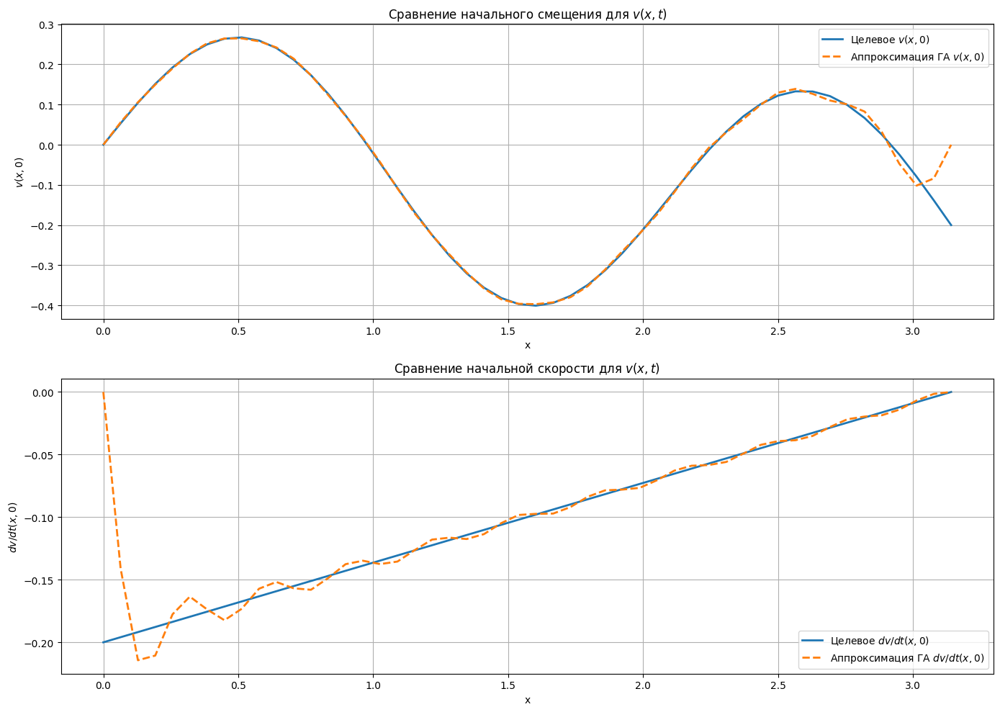

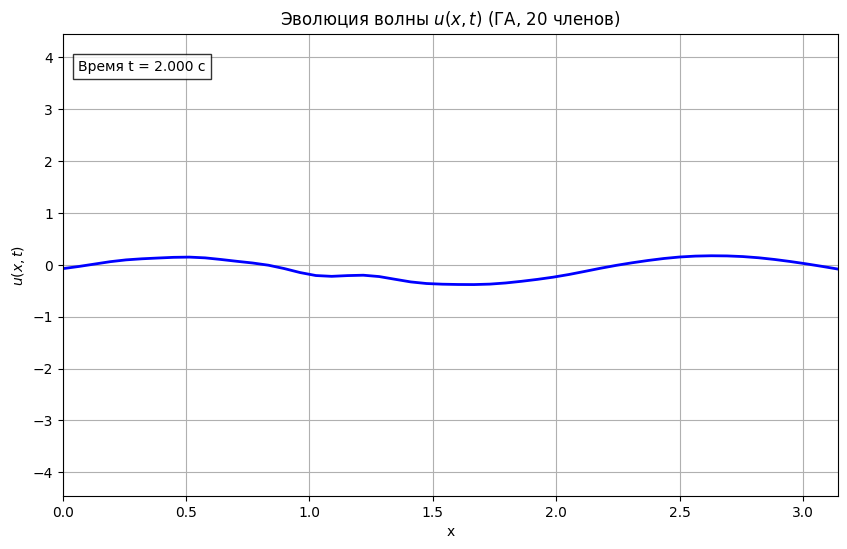

In [4]:
# @title Волновое уравнение с неоднородными гран условиями
L = np.pi             # Длина струны/стержня
c_wave_speed = 1.0  # Скорость волны (вместо alpha)
N_terms = 20         # Количество членов в ряде (A_k и B_k для каждого k)
T_visualization = 2.0 # Время для конечной визуализации решения

POP_SIZE = 500
NGEN = 500
CXPB = 0.6
MUTPB = 0.2
# Диапазон для коэффициентов A_k, B_k
COEFF_BOUND_LOW, COEFF_BOUND_UP = -1.0, 1.0

# Точки для оценки ошибки по начальным условиям
Nx_eval = 50
x_eval_points = np.linspace(0, L, Nx_eval)

# Предполагаем линейные во времени ГУ: phi(t) = U + V*t
# Граничные условия (неоднородные)
U0_bc, V0_bc = 0.1, 2.0  # u(0,t) = 0.1 * sin(2t)
UL_bc, VL_bc = 0.2, -1.0  # u(π,t) = 0.2 * cos(t)

def phi0_func(t_time):
    return U0_bc * np.sin(V0_bc * t_time)  # 0.1 * sin(2t)

def dphi0_dt_func(t_time):
    return U0_bc * V0_bc * np.cos(V0_bc * t_time)  # Производная: 0.2 * cos(2t)

def phiL_func(t_time):
    return UL_bc * np.cos(VL_bc * t_time)  # 0.2 * cos(t)

def dphiL_dt_func(t_time):
    return -UL_bc * VL_bc * np.sin(VL_bc * t_time)  # Производная: 0.2 * sin(t)

def w_xt(x_coords, t_time, length):
    return phi0_func(t_time) * (1 - x_coords / length) + phiL_func(t_time) * (x_coords / length)

def dw_dt_xt(x_coords, t_time, length): # d(w)/dt
    return dphi0_dt_func(t_time) * (1 - x_coords / length) + dphiL_dt_func(t_time) * (x_coords / length)

def initial_displacement_f(x_coords, length):
    return 0.3 * np.sin(3 * x_coords)  # 0.3 * sin(3x)
    # return np.zeros_like(x_coords) # Пример: нулевое начальное смещение

def initial_velocity_g(x_coords, length):
    """Начальная скорость du/dt(x,0) = g(x)."""
    # Пример: начальный импульс скорости в центре
    # profile = np.zeros_like(x_coords)
    # width = length / 10
    # center = length / 2
    # profile[(x_coords >= center - width/2) & (x_coords <= center + width/2)] = 1.0
    # return profile
    return np.zeros_like(x_coords) # Пример: нулевая начальная скорость

# v(x,0) = f(x) - w(x,0)
w_at_t0 = w_xt(x_eval_points, 0.0, L)
target_v_displacement_at_t0 = initial_displacement_f(x_eval_points, L) - w_at_t0

# dv/dt(x,0) = g(x) - dw/dt(x,0)
dw_dt_at_t0 = dw_dt_xt(x_eval_points, 0.0, L)
target_v_velocity_at_t0 = initial_velocity_g(x_eval_points, L) - dw_dt_at_t0

def v_approx_displacement_at_t0(x_coords, coeffs_A, length, num_terms):
    """v(x,0) на основе коэффициентов A_k."""
    profile = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        profile += coeffs_A[k_idx] * np.sin(k_val * np.pi * x_coords / length)
    return profile

def v_approx_velocity_at_t0(x_coords, coeffs_B, speed_c, length, num_terms):
    """dv/dt(x,0) на основе коэффициентов B_k."""
    profile = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        omega_k = k_val * np.pi * speed_c / length
        profile += coeffs_B[k_idx] * omega_k * np.sin(k_val * np.pi * x_coords / length)
    return profile

def v_solution_general(x_coords, t_time, coeffs_A, coeffs_B, speed_c, length, num_terms):
    """Рассчитывает v(x,t) по коэффициентам A_k и B_k."""
    profile_v = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        omega_k = k_val * np.pi * speed_c / length
        term_A = coeffs_A[k_idx] * np.cos(omega_k * t_time)
        term_B = coeffs_B[k_idx] * np.sin(omega_k * t_time)
        profile_v += (term_A + term_B) * np.sin(k_val * np.pi * x_coords / length)
    return profile_v

def u_solution_total(x_coords, t_time, coeffs_A, coeffs_B, speed_c, length, num_terms):
    """Полное решение u(x,t) = v(x,t) + w(x,t)."""
    v_part = v_solution_general(x_coords, t_time, coeffs_A, coeffs_B, speed_c, length, num_terms)
    w_part = w_xt(x_coords, t_time, length)
    return v_part + w_part

creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()
toolbox.register("attr_float", np.random.uniform, COEFF_BOUND_LOW, COEFF_BOUND_UP)
toolbox.register("individual", tools.initRepeat, creator.Individual,
                 toolbox.attr_float, n=2 * N_terms)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

def evaluate_fitness_wave(individual_coeffs):
    coeffs_A = individual_coeffs[:N_terms]
    coeffs_B = individual_coeffs[N_terms:]

    v_displ_approx = v_approx_displacement_at_t0(x_eval_points, coeffs_A, L, N_terms)
    error_displacement = np.sum((v_displ_approx - target_v_displacement_at_t0)**2)

    v_vel_approx = v_approx_velocity_at_t0(x_eval_points, coeffs_B, c_wave_speed, L, N_terms)
    error_velocity = np.sum((v_vel_approx - target_v_velocity_at_t0)**2)

    total_error = error_displacement + error_velocity
    return (total_error,)

toolbox.register("evaluate", evaluate_fitness_wave)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.5, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

print(f"Считаем коэффициенты в количестве {2*N_terms} ")
pop = toolbox.population(n=POP_SIZE)
hof = tools.HallOfFame(1)

stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

algorithms.eaSimple(pop, toolbox, cxpb=CXPB, mutpb=MUTPB,
                    ngen=NGEN, stats=stats, halloffame=hof, verbose=True)

best_coeffs_combined = hof[0]
best_coeffs_A = best_coeffs_combined[:N_terms]
best_coeffs_B = best_coeffs_combined[N_terms:]

print(f"\nA_k: {np.array(best_coeffs_A)}")
print(f"\nB_k: {np.array(best_coeffs_B)}")
print(f"\nError: {hof[0].fitness.values[0]:.4e}")

plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
plt.plot(x_eval_points, target_v_displacement_at_t0, label="Целевое $v(x,0)$", linewidth=2)
v_displ_plot = v_approx_displacement_at_t0(x_eval_points, best_coeffs_A, L, N_terms)
plt.plot(x_eval_points, v_displ_plot, '--', label=f"Аппроксимация ГА $v(x,0)$", linewidth=2)
plt.title("Сравнение начального смещения для $v(x,t)$")
plt.xlabel("x"); plt.ylabel("$v(x,0)$"); plt.legend(); plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(x_eval_points, target_v_velocity_at_t0, label="Целевое $dv/dt(x,0)$", linewidth=2)
v_vel_plot = v_approx_velocity_at_t0(x_eval_points, best_coeffs_B, c_wave_speed, L, N_terms)
plt.plot(x_eval_points, v_vel_plot, '--', label=f"Аппроксимация ГА $dv/dt(x,0)$", linewidth=2)
plt.title("Сравнение начальной скорости для $v(x,t)$")
plt.xlabel("x"); plt.ylabel("$dv/dt(x,0)$"); plt.legend(); plt.grid(True)
plt.tight_layout()
plt.show()

fig_anim, ax_anim = plt.subplots(figsize=(10, 6))
ax_anim.set_xlim(0, L)

u_max_abs_est = 1.5 * np.max(np.abs(initial_displacement_f(x_eval_points, L))) + \
                np.max(np.abs([U0_bc, UL_bc, V0_bc*T_visualization, VL_bc*T_visualization]))

if u_max_abs_est < 1e-9: u_max_abs_est = 1.0
ax_anim.set_ylim(-u_max_abs_est, u_max_abs_est)
ax_anim.set_xlabel("x"); ax_anim.set_ylabel("$u(x,t)$")
ax_anim.set_title(f"Эволюция волны $u(x,t)$ (ГА, {N_terms} членов)")
ax_anim.grid(True)

line_anim_u, = ax_anim.plot([], [], lw=2, color='blue')
time_text_anim_u = ax_anim.text(0.02, 0.92, '', transform=ax_anim.transAxes, bbox=dict(facecolor='white', alpha=0.8))

time_points_anim = np.linspace(0, T_visualization, 150)

def init_anim_func_u():
    line_anim_u.set_data([], [])
    time_text_anim_u.set_text('')
    return line_anim_u, time_text_anim_u

def animate_frame_u(t_current):
    u_profile = u_solution_total(x_eval_points, t_current, best_coeffs_A, best_coeffs_B, c_wave_speed, L, N_terms)
    line_anim_u.set_data(x_eval_points, u_profile)
    time_text_anim_u.set_text(f"Время t = {t_current:.3f} с")
    return line_anim_u, time_text_anim_u

ani_u = FuncAnimation(fig_anim, animate_frame_u, frames=time_points_anim,
                      init_func=init_anim_func_u, blit=True, interval=50)

display(HTML(ani_u.to_jshtml()))

/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Epoch 0, Loss: 0.43057844042778015
Epoch 500, Loss: 0.0006190154235810041
Epoch 1000, Loss: 0.00035052382736466825
Epoch 1500, Loss: 0.00018192370771430433
Epoch 2000, Loss: 0.0002500108676031232
Epoch 2500, Loss: 0.00010805571946548298
Epoch 3000, Loss: 3.9184513298096135e-05
Epoch 3500, Loss: 7.986006676219404e-05
Epoch 4000, Loss: 0.00013378739822655916
Epoch 4500, Loss: 4.28508865297772e-05


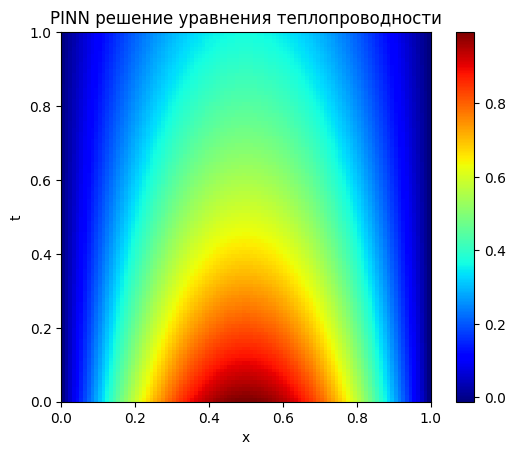

In [5]:
# @title Тепловое уравнения с НС {"display-mode":"form"}
import torch
import torch.nn as nn

# Нейросеть для аппроксимации u(t, x)
class PINN(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(2, 20), nn.Tanh(),  # вход: (t, x)
            nn.Linear(20, 20), nn.Tanh(),
            nn.Linear(20, 1)  # выход: u(t, x)
        )

    def forward(self, t, x):
        return self.fc(torch.cat([t, x], dim=1))

# Уравнение теплопроводности: du/dt - alpha * d²u/dx² = 0
def heat_eqn(pinn, t, x, alpha=0.1):
    u = pinn(t, x)
    # Автодифференцирование для градиентов
    du_dt = torch.autograd.grad(u.sum(), t, create_graph=True)[0]
    du_dx = torch.autograd.grad(u.sum(), x, create_graph=True)[0]
    d2u_dx2 = torch.autograd.grad(du_dx.sum(), x, create_graph=True)[0]
    return du_dt - alpha * d2u_dx2

# Генерация данных
t_data = torch.linspace(0, 1, 10, requires_grad=True).view(-1, 1)
x_data = torch.linspace(0, 1, 20, requires_grad=True).view(-1, 1)
t_grid, x_grid = torch.meshgrid(t_data.squeeze(), x_data.squeeze())


# Инициализация модели и оптимизатора
pinn = PINN()
optimizer = torch.optim.Adam(pinn.parameters(), lr=0.01)

# Обучение
for epoch in range(5000):
    optimizer.zero_grad()

    # Loss по начальным данным
    u_pred_init = pinn(torch.zeros_like(x_data), x_data)
    loss_init = torch.mean((u_pred_init - torch.sin(np.pi * x_data))**2)

    # Loss по граничным условиям
    u_pred_boundary_left = pinn(t_data, torch.zeros_like(t_data))
    u_pred_boundary_right = pinn(t_data, torch.ones_like(t_data))
    loss_boundary = torch.mean(u_pred_boundary_left**2) + torch.mean(u_pred_boundary_right**2)


    # Loss по уравнению (коллокационные точки)
    t_colloc = torch.rand(100, 1, requires_grad=True)
    x_colloc = torch.rand(100, 1, requires_grad=True)
    loss_pde = torch.mean(heat_eqn(pinn, t_colloc, x_colloc)**2)

    # Общий loss
    loss = loss_init + loss_boundary + loss_pde
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item()}")

# Визуализация
with torch.no_grad():
    t_test = torch.linspace(0, 1, 100)
    x_test = torch.linspace(0, 1, 100)
    T, X = torch.meshgrid(t_test, x_test, indexing='ij')  # [100, 100] каждое

    # Преобразуем в векторы [10000, 1]
    t_input = T.reshape(-1, 1)
    x_input = X.reshape(-1, 1)

    u_pred = pinn(t_input, x_input).reshape(100, 100).numpy()  # теперь всё корректно


plt.imshow(u_pred, extent=[0, 1, 0, 1], origin="lower", cmap="jet")
plt.colorbar()
plt.xlabel("x"); plt.ylabel("t")
plt.title("PINN решение уравнения теплопроводности")
plt.show()

/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


Запуск генетического алгоритма для подбора 7 коэффициентов...
gen	nevals	avg       	min   	max        
0  	200   	1.4119e+06	225293	3.21994e+06
1  	159   	1.03229e+06	177693	2.71749e+06
2  	150   	766226     	98277.6	2.18313e+06
3  	141   	550386     	63990.6	1.91339e+06
4  	160   	338088     	36543.2	1.09665e+06
5  	135   	178203     	28916.8	667579     
6  	134   	119291     	14020.2	402934     
7  	166   	85992.1    	11199.6	280451     
8  	137   	56340.5    	4555.91	269037     
9  	156   	46147.6    	3973.26	270345     
10 	140   	30509.9    	3318.01	125183     
11 	137   	19977.3    	1752.7 	85018.1    
12 	154   	14711.6    	2189.61	147536     
13 	139   	10465.1    	1095.83	178186     
14 	153   	6892.7     	551.654	90779      
15 	147   	5791.29    	575.146	106582     
16 	133   	4538.53    	446.379	64127.8    
17 	145   	4259.16    	200.042	65195.9    
18 	151   	5051.55    	53.7607	145225     
19 	148   	3055.37    	53.7607	64736.5    
20 	154   	2426.98    	53.7607	43532.8  

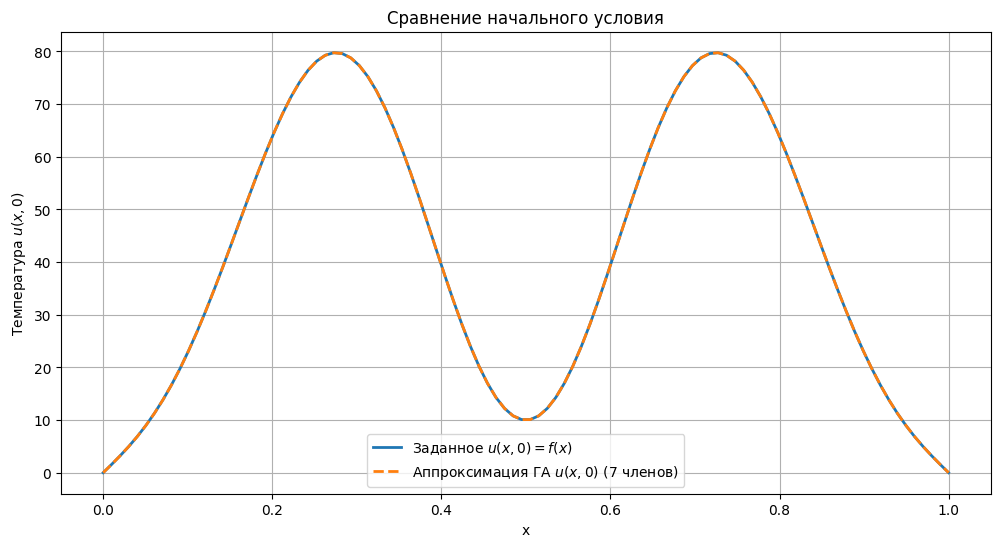

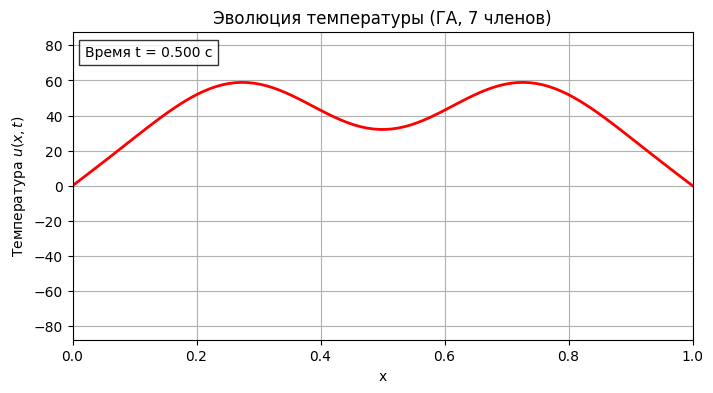

In [6]:
# @title Тепловое уравнение ГА
L = 1.0
alpha = 0.01
N_terms = 7
T_visualization = 0.5

POP_SIZE = 200
NGEN = 300
CXPB = 0.7
MUTPB = 0.2
BOUND_LOW, BOUND_UP = -100.0, 100.0

# Точки для оценки ошибки по начальному условию
Nx_eval = 100
x_eval_points = np.linspace(0, L, Nx_eval)

# --- 2. Начальное условие u(x,0) = f(x) ---
def initial_condition_function(x_coords, length):
    """Начальное распределение температуры."""
    # Пример 1: Треугольный импульс
    # return np.where(x_coords <= length/2, 20 * x_coords/length, 20 * (1 - x_coords/length))
    # Пример 2: Прямоугольный импульс
    # profile = np.zeros_like(x_coords)
    # profile[(x_coords >= length*0.3) & (x_coords <= length*0.7)] = 50.0
    # return profile
    # Пример 3: Гладкая функция, хорошо представляемая несколькими синусами
    return 60 * np.sin(1 * np.pi * x_coords / length) + \
           30 * np.sin(3 * np.pi * x_coords / length) - \
           20 * np.sin(5 * np.pi * x_coords / length)
    # return np.sin(np.pi*x_coords)

target_initial_profile = initial_condition_function(x_eval_points, L)

def assumed_solution_at_t0(x_coords, coeffs_C, length, num_terms):
    """Рассчитывает u(x,0) по коэффициентам C_k."""
    profile_at_t0 = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        profile_at_t0 += coeffs_C[k_idx] * np.sin(k_val * np.pi * x_coords / length)
    return profile_at_t0

def assumed_solution_general(x_coords, t_time, coeffs_C, length, alpha_val, num_terms):
    """Рассчитывает u(x,t) по коэффициентам C_k."""
    profile = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        lambda_k_sq = (k_val * np.pi / length)**2
        temporal_decay = np.exp(-alpha_val * lambda_k_sq * t_time)
        spatial_term = np.sin(k_val * np.pi * x_coords / length)
        profile += coeffs_C[k_idx] * temporal_decay * spatial_term
    return profile


creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

toolbox = base.Toolbox()

toolbox.register("attr_float", np.random.uniform, BOUND_LOW, BOUND_UP)
toolbox.register("individual", tools.initRepeat, creator.Individual,
                 toolbox.attr_float, n=N_terms)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Функция приспособленности
def evaluate_fitness(individual_coeffs):
    approximated_profile_t0 = assumed_solution_at_t0(x_eval_points, individual_coeffs, L, N_terms)
    # Сумма квадратов ошибок
    error = np.sum((approximated_profile_t0 - target_initial_profile)**2)
    return (error,)

toolbox.register("evaluate", evaluate_fitness)

# Генетические операторы
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=15.0, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

print(f"Запуск генетического алгоритма для подбора {N_terms} коэффициентов...")
pop = toolbox.population(n=POP_SIZE)
hof = tools.HallOfFame(1)

stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)
stats.register("max", np.max)

algorithms.eaSimple(pop, toolbox, cxpb=CXPB, mutpb=MUTPB,
                    ngen=NGEN, stats=stats, halloffame=hof, verbose=True)

best_individual_coeffs = hof[0]
print(f"\nЛучшие найденные коэффициенты C_k: {np.array(best_individual_coeffs)}")
print(f"Минимальная ошибка (фитнес): {hof[0].fitness.values[0]:.4e}")


plt.figure(figsize=(12, 6))
plt.plot(x_eval_points, target_initial_profile, label="Заданное $u(x,0) = f(x)$", linewidth=2)
approximated_ic_plot = assumed_solution_at_t0(x_eval_points, best_individual_coeffs, L, N_terms)
plt.plot(x_eval_points, approximated_ic_plot, '--', label=f"Аппроксимация ГА $u(x,0)$ ({N_terms} членов)", linewidth=2)
plt.title("Сравнение начального условия")
plt.xlabel("x")
plt.ylabel("Температура $u(x,0)$")
plt.legend()
plt.grid(True)
plt.show()

fig_anim, ax_anim = plt.subplots(figsize=(8, 4))
ax_anim.set_xlim(0, L)
u_max_abs = np.max(np.abs(target_initial_profile)) * 1.1
if u_max_abs < 1e-9: u_max_abs = 1.0 # если нулевое начальное условие
ax_anim.set_ylim(-u_max_abs, u_max_abs)
ax_anim.set_xlabel("x")
ax_anim.set_ylabel("Температура $u(x,t)$")
ax_anim.set_title(f"Эволюция температуры (ГА, {N_terms} членов)")
ax_anim.grid(True)

line_anim, = ax_anim.plot([], [], lw=2, color='red')
time_text_anim = ax_anim.text(0.02, 0.92, '', transform=ax_anim.transAxes, bbox=dict(facecolor='white', alpha=0.8))

time_points_anim = np.linspace(0, T_visualization, 100)

def init_anim_func():
    line_anim.set_data([], [])
    time_text_anim.set_text('')
    return line_anim, time_text_anim

def animate_frame(t_current):
    y_profile = assumed_solution_general(x_eval_points, t_current, best_individual_coeffs, L, alpha, N_terms)
    line_anim.set_data(x_eval_points, y_profile)
    time_text_anim.set_text(f"Время t = {t_current:.3f} с")
    return line_anim, time_text_anim

ani = FuncAnimation(fig_anim, animate_frame, frames=time_points_anim,
                    init_func=init_anim_func, blit=True, interval=50)

display(HTML(ani.to_jshtml()))

/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.11/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


Запуск ГА для подбора 7 коэффициентов для v(x,t)...
Целевой профиль v(x,0) (первые 5 точек): [0. 0. 0. 0. 0.]
gen	nevals	avg    	min    
0  	200   	55.6939	5.86995
1  	144   	42.9517	5.86995
2  	140   	30.866 	6.37154
3  	150   	23.5135	1.71273
4  	166   	14.9692	2.38408
5  	147   	10.1581	2.19264
6  	153   	6.89285	0.423314
7  	155   	4.47662	0.423314
8  	157   	3.14892	0.210404
9  	139   	2.30654	0.255871
10 	152   	1.55004	0.164476
11 	162   	0.971236	0.147879
12 	150   	0.676777	0.0787426
13 	149   	0.440241	0.062657 
14 	155   	0.382354	0.0486422
15 	167   	0.294949	0.0320442
16 	146   	0.206056	0.0128623
17 	153   	0.139748	0.00877008
18 	151   	0.122061	0.00993959
19 	133   	0.134532	0.00290748
20 	161   	0.13868 	0.00290748
21 	146   	0.100775	0.00290748
22 	147   	0.0842892	0.00290748
23 	140   	0.0717917	0.000669373
24 	147   	0.0774395	0.000335517
25 	151   	0.0793587	0.000722737
26 	165   	0.0538851	0.00065823 
27 	163   	0.102807 	0.000130857
28 	158   	0.0854779	0.0002949

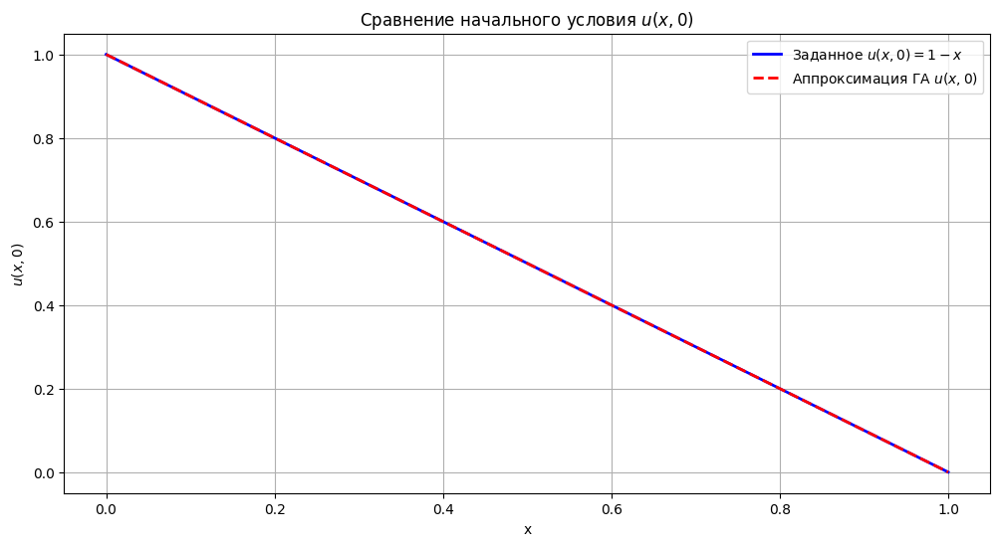

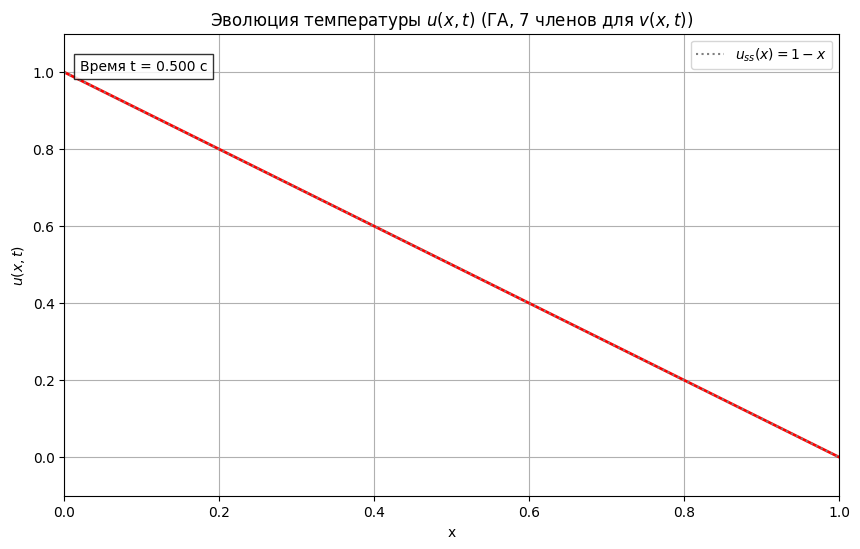

In [7]:
# @title Тепловое уравнение ГА с неоднородными ГУ
L = 1.0
alpha = 0.01
N_terms = 7
T_visualization = 0.5

POP_SIZE = 200
NGEN = 100
CXPB = 0.7
MUTPB = 0.2
COEFF_BOUND_LOW, COEFF_BOUND_UP = -1.0, 1.0

# Точки для оценки ошибки по начальному условию
Nx_eval = 50
x_eval_points = np.linspace(0, L, Nx_eval)

# Определение стационарной части решения u_ss(x)
def steady_state_solution_uss(x_coords, length_param):
    return 1.0 - x_coords

# Начальное условие для u(x,t) ---
def initial_condition_u_actual(x_coords, length_param):
    return 1.0 - x_coords

# Целевое начальное условие для v(x,t) ---
# v(x,0) = u(x,0) - u_ss(x)
uss_at_t0 = steady_state_solution_uss(x_eval_points, L)
u_actual_at_t0 = initial_condition_u_actual(x_eval_points, L)
target_v_initial_profile = u_actual_at_t0 - uss_at_t0

# v(x,t) = sum( C_k * exp(-alpha * (k*pi/L)^2 * t) * sin(k*pi*x/L) )

def v_solution_at_t0(x_coords, coeffs_C, length, num_terms):
    """Рассчитывает v(x,0) по коэффициентам C_k."""
    profile_v_t0 = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        profile_v_t0 += coeffs_C[k_idx] * np.sin(k_val * np.pi * x_coords / length)
    return profile_v_t0

def v_solution_general(x_coords, t_time, coeffs_C, length, alpha_val, num_terms):
    """Рассчитывает v(x,t) по коэффициентам C_k."""
    profile_v = np.zeros_like(x_coords, dtype=float)
    for k_idx in range(num_terms):
        k_val = k_idx + 1
        lambda_term = alpha_val * (k_val * np.pi / length)**2
        temporal_decay = np.exp(-lambda_term * t_time)
        spatial_term = np.sin(k_val * np.pi * x_coords / length)
        profile_v += coeffs_C[k_idx] * temporal_decay * spatial_term
    return profile_v

creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

toolbox = base.Toolbox()
toolbox.register("attr_float", np.random.uniform, COEFF_BOUND_LOW, COEFF_BOUND_UP)
toolbox.register("individual", tools.initRepeat, creator.Individual,
                 toolbox.attr_float, n=N_terms)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

def evaluate_fitness(individual_coeffs):
    approximated_v_profile_t0 = v_solution_at_t0(x_eval_points, individual_coeffs, L, N_terms)
    error = np.sum((approximated_v_profile_t0 - target_v_initial_profile)**2)
    return (error,)

toolbox.register("evaluate", evaluate_fitness)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.1, indpb=0.2) # sigma меньше, т.к. C_k -> 0
toolbox.register("select", tools.selTournament, tournsize=3)

print(f"Запуск ГА для подбора {N_terms} коэффициентов для v(x,t)...")
print(f"Целевой профиль v(x,0) (первые 5 точек): {target_v_initial_profile[:5]}")
pop = toolbox.population(n=POP_SIZE)
hof = tools.HallOfFame(1)

stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

algorithms.eaSimple(pop, toolbox, cxpb=CXPB, mutpb=MUTPB,
                    ngen=NGEN, stats=stats, halloffame=hof, verbose=True)

best_coeffs_C = hof[0]
print(f"\nЛучшие найденные коэффициенты C_k для v(x,t): {np.array(best_coeffs_C)}")
print(f"Минимальная ошибка (фитнес) для v(x,0): {hof[0].fitness.values[0]:.4e}")


plt.figure(figsize=(12, 6))
plt.plot(x_eval_points, u_actual_at_t0, label="Заданное $u(x,0) = 1-x$", linewidth=2, color='blue')
v_approx_plot_t0 = v_solution_at_t0(x_eval_points, best_coeffs_C, L, N_terms)
u_approx_plot_t0 = v_approx_plot_t0 + uss_at_t0
plt.plot(x_eval_points, u_approx_plot_t0, '--', label=f"Аппроксимация ГА $u(x,0)$", linewidth=2, color='red')
plt.title("Сравнение начального условия $u(x,0)$")
plt.xlabel("x"); plt.ylabel("$u(x,0)$"); plt.legend(); plt.grid(True)
plt.show()

fig_anim, ax_anim = plt.subplots(figsize=(10, 6))
ax_anim.set_xlim(0, L)
y_min = min(np.min(u_actual_at_t0), 0, 1) - 0.1 # ГУ u(0,t)=1, u(1,t)=0
y_max = max(np.max(u_actual_at_t0), 0, 1) + 0.1
ax_anim.set_ylim(y_min, y_max)
ax_anim.set_xlabel("x"); ax_anim.set_ylabel("$u(x,t)$")
ax_anim.set_title(f"Эволюция температуры $u(x,t)$ (ГА, {N_terms} членов для $v(x,t)$)")
ax_anim.grid(True)

line_anim_u, = ax_anim.plot([], [], lw=2, color='red')
time_text_anim_u = ax_anim.text(0.02, 0.92, '', transform=ax_anim.transAxes, bbox=dict(facecolor='white', alpha=0.8))
ax_anim.plot(x_eval_points, uss_at_t0, label="$u_{ss}(x) = 1-x$", linestyle=':', color='gray')
ax_anim.legend(loc='upper right')


time_points_anim = np.linspace(0, T_visualization, 100)

def init_anim_func_u():
    line_anim_u.set_data([], [])
    time_text_anim_u.set_text('')
    return line_anim_u, time_text_anim_u

def animate_frame_u(t_current):
    v_profile = v_solution_general(x_eval_points, t_current, best_coeffs_C, L, alpha, N_terms)
    u_profile = v_profile + steady_state_solution_uss(x_eval_points, L) # u(x,t) = v(x,t) + u_ss(x)
    line_anim_u.set_data(x_eval_points, u_profile)
    time_text_anim_u.set_text(f"Время t = {t_current:.3f} с")
    return line_anim_u, time_text_anim_u

ani_u = FuncAnimation(fig_anim, animate_frame_u, frames=time_points_anim,
                    init_func=init_anim_func_u, blit=True, interval=50)

display(HTML(ani_u.to_jshtml()))

Параметры симуляции:
  Длина стержня L = 3.141592653589793 м
  Общее время T_end = 0.6317 с
  Коэф. температуропроводности alpha = 0.01 м^2/с
  Число узлов по X: Nx = 51
  Шаг по пространству dx = 0.0628 м
  Максимальный dt для стабильности: 0.197392 с
  Выбранный шаг по времени dt = 0.157914 с
  Количество шагов по времени Nt = 4
  Число r = alpha*dt/dx^2 = 0.4000 (должно быть <= 0.5)


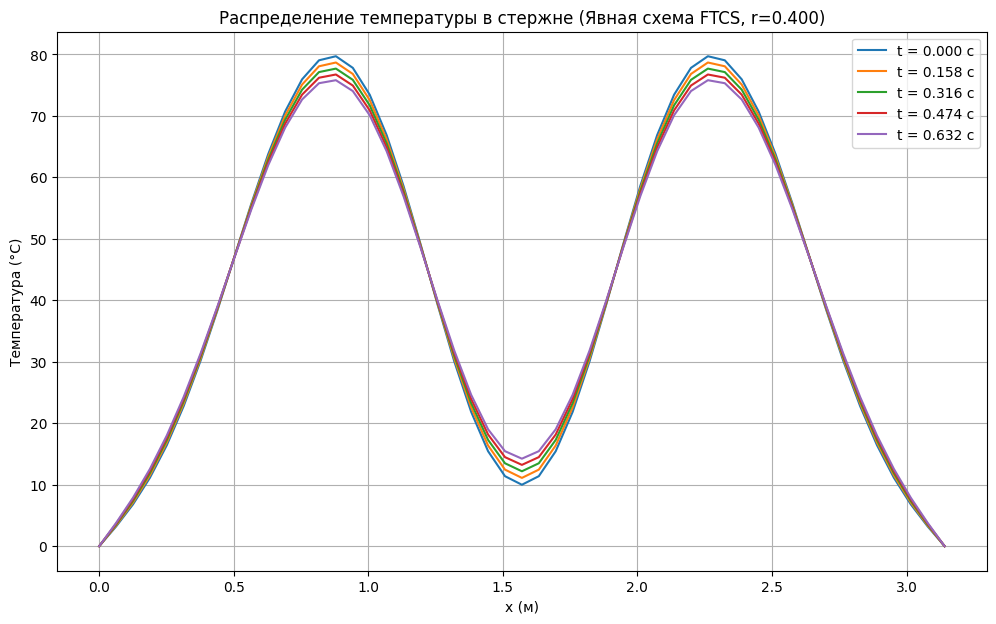

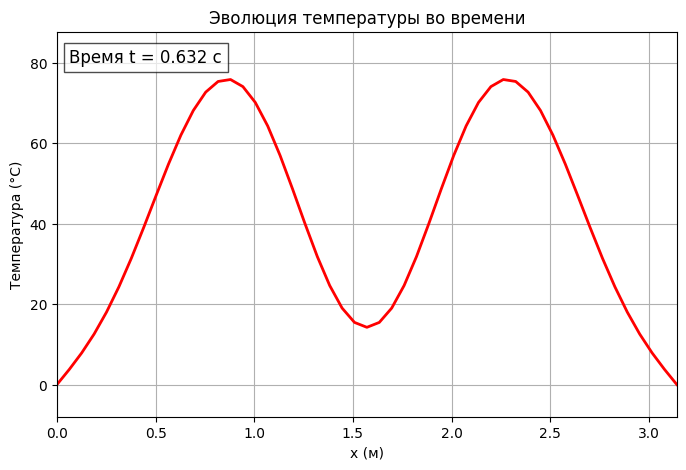

In [8]:
# @title Тепловое уравнение: метод конечных разностей {"display-mode":"form"}
L = np.pi
T_end = 0.5
alpha = 0.01        # Коэффициент температуропроводности (м^2/с)

# Параметры дискретизации сетки
Nx = 51             # Количество узлов сетки по пространству (включая граничные, Nx-1 интервалов)
dx = L / (Nx - 1)   # Шаг по пространству


# Условие стабильности: r = alpha * dt / dx^2 <= 0.5
# => dt <= 0.5 * dx^2 / alpha
dt_max_stability = 0.5 * dx**2 / alpha
dt = 0.8 * dt_max_stability

Nt = int(T_end / dt) # Количество временных шагов
if Nt * dt < T_end:
    Nt += 1
    T_end = Nt * dt  # Скорректируем T_end, чтобы он был кратен dt

r_value = alpha * dt / dx**2 # Фактическое значение r

print(f"Параметры симуляции:")
print(f"  Длина стержня L = {L} м")
print(f"  Общее время T_end = {T_end:.4f} с")
print(f"  Коэф. температуропроводности alpha = {alpha} м^2/с")
print(f"  Число узлов по X: Nx = {Nx}")
print(f"  Шаг по пространству dx = {dx:.4f} м")
print(f"  Максимальный dt для стабильности: {dt_max_stability:.6f} с")
print(f"  Выбранный шаг по времени dt = {dt:.6f} с")
print(f"  Количество шагов по времени Nt = {Nt}")
print(f"  Число r = alpha*dt/dx^2 = {r_value:.4f} (должно быть <= 0.5)")

if r_value > 0.5:
    print(f"ВНИМАНИЕ: Условие стабильности r <= 0.5 НЕ ВЫПОЛНЕНО (r = {r_value:.3f})!")
    print(f"  Пожалуйста, увеличьте Nx (уменьшив dx) или уменьшите dt (увеличив Nt).")
    # exit() # Можно остановить выполнение, если условие стабильности нарушено

x_grid = np.linspace(0, L, Nx)
u = np.zeros(Nx)                # Массив для температуры в текущий момент времени

# Начальное условие u(x,0) = f(x)
# Пример 1: Синусоидальное начальное распределение
# u = 100.0 * np.sin(np.pi * x_grid / L)

# Пример 2: "Горячий центр, холодные края" (прямоугольный импульс)
# u = 20.0 * np.ones(Nx) # Начальная температура везде 20 градусов
# u[int(Nx*0.4):int(Nx*0.6)] = 100.0 # Центральная часть горячее

# Пример 3: Ступенчатое начальное условие
# u_initial_left = 100.0  # Температура левой половины
# u_initial_right = 0.0   # Температура правой половины
# u[:Nx//2] = u_initial_left
# u[Nx//2:] = u_initial_right
# u = 0.5 * np.sin(x_grid)+0.3*np.sin(3*x_grid)
u = 60*np.sin(np.pi*x_grid/L)+30*np.sin(3*x_grid*np.pi/L)-20*np.sin(5*np.pi*x_grid/L)

# Сохраняем копию начального профиля для графиков
u_initial_profile = u.copy()

# Граничные условия
T_left_boundary = 0.0   # Температура на левой границе u(0,t)
T_right_boundary = 0.0  # Температура на правой границе u(L,t)

plot_every_n_steps = max(1, Nt // 20) # Сохранять примерно 20 кадров + начальный + конечный
u_history = [u_initial_profile.copy()]
t_history = [0.0]


u_current = u.copy() # Температура на текущем временном слое (t_n)
# u_next = np.zeros(Nx) # Температура на следующем временном слое (t_{n+1}) # Не нужна если обновлять u_current на месте
for n_step in range(Nt):
    u_previous = u_current.copy()
    u_current[0] = T_left_boundary
    u_current[Nx-1] = T_right_boundary

    for i in range(1, Nx - 1):
        u_current[i] = u_previous[i] + \
                       r_value * (u_previous[i+1] - 2*u_previous[i] + u_previous[i-1])

    if (n_step + 1) % plot_every_n_steps == 0 or (n_step + 1) == Nt:
        u_history.append(u_current.copy())
        t_history.append((n_step + 1) * dt)

plt.figure(figsize=(12, 7))
num_plots = len(u_history)
max_curves_to_plot = 10
indices_to_plot = np.linspace(0, num_plots - 1, min(num_plots, max_curves_to_plot), dtype=int)

for i in indices_to_plot:
    plt.plot(x_grid, u_history[i], label=f"t = {t_history[i]:.3f} с")

plt.title(f"Распределение температуры в стержне (Явная схема FTCS, r={r_value:.3f})")
plt.xlabel("x (м)")
plt.ylabel("Температура (°C)")
plt.legend(loc='best')
plt.grid(True)
# plt.savefig("my_plot.png", dpi=300, bbox_inches='tight')  # dpi - качество изображения
plt.show()

if len(u_history) > 1: # Есть что анимировать
    fig_anim, ax_anim = plt.subplots(figsize=(8, 5))

    min_temp_hist = np.min(u_history)
    max_temp_hist = np.max(u_history)
    y_margin = (max_temp_hist - min_temp_hist) * 0.1 if (max_temp_hist - min_temp_hist) > 1e-5 else 1.0

    ax_anim.set_xlim(0, L)
    ax_anim.set_ylim(min_temp_hist - y_margin, max_temp_hist + y_margin)
    ax_anim.set_xlabel("x (м)")
    ax_anim.set_ylabel("Температура (°C)")
    ax_anim.set_title("Эволюция температуры во времени")
    ax_anim.grid(True)

    line_anim, = ax_anim.plot([], [], lw=2, color='red')
    time_text_anim = ax_anim.text(0.02, 0.92, '', transform=ax_anim.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.7))

    num_animation_frames = len(u_history)

    def init_animation():
        line_anim.set_data([], [])
        time_text_anim.set_text('')
        return line_anim, time_text_anim

    def animate(i_frame):
        line_anim.set_data(x_grid, u_history[i_frame])
        time_text_anim.set_text(f"Время t = {t_history[i_frame]:.3f} с")
        return line_anim, time_text_anim

    ani = FuncAnimation(fig_anim, animate, frames=num_animation_frames,
                        init_func=init_animation, blit=True, interval=max(50, 2000 // num_animation_frames)) # interval в мс

    display(HTML(ani.to_jshtml()))

gen	nevals	avg        	min        
0  	350   	4.80887e+06	4.46309e+06
1  	228   	4.70059e+06	4.46309e+06
2  	195   	4.62784e+06	4.40134e+06
3  	221   	4.56414e+06	4.33407e+06
4  	226   	4.51766e+06	4.30856e+06
5  	218   	4.47163e+06	4.28834e+06
6  	229   	4.42288e+06	4.24294e+06
7  	218   	4.38422e+06	4.1881e+06 
8  	228   	4.33846e+06	4.09433e+06
9  	237   	4.29318e+06	4.11771e+06
10 	246   	4.25048e+06	3.99864e+06
11 	222   	4.19728e+06	3.94827e+06
12 	231   	4.15353e+06	3.88529e+06
13 	230   	4.09955e+06	3.88529e+06
14 	199   	4.04008e+06	3.80807e+06
15 	221   	3.98631e+06	3.7878e+06 
16 	244   	3.93392e+06	3.74312e+06
17 	235   	3.88252e+06	3.56406e+06
18 	232   	3.82794e+06	3.52302e+06
19 	221   	3.774e+06  	3.5138e+06 
20 	236   	3.69908e+06	3.34763e+06
21 	226   	3.6063e+06 	3.19836e+06
22 	241   	3.51042e+06	3.14661e+06
23 	213   	3.41007e+06	2.7589e+06 
24 	212   	3.2891e+06 	2.7589e+06 
25 	218   	3.16563e+06	2.77675e+06
26 	209   	3.05081e+06	2.27397e+06
27 	236   	2.9237e+0

/usr/local/lib/python3.11/dist-packages/scipy/optimize/_minimize.py:733: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: 10741.917663
         Iterations: 10
         Function evaluations: 453
         Gradient evaluations: 63

Оптимизированные параметры: [-4.90871707e-01 -2.70166305e+01  1.51195190e+02 -4.87717987e-03
 -1.75236492e-02 -3.34096866e+00]
Финальная ошибка после BFGS: 10741.917663


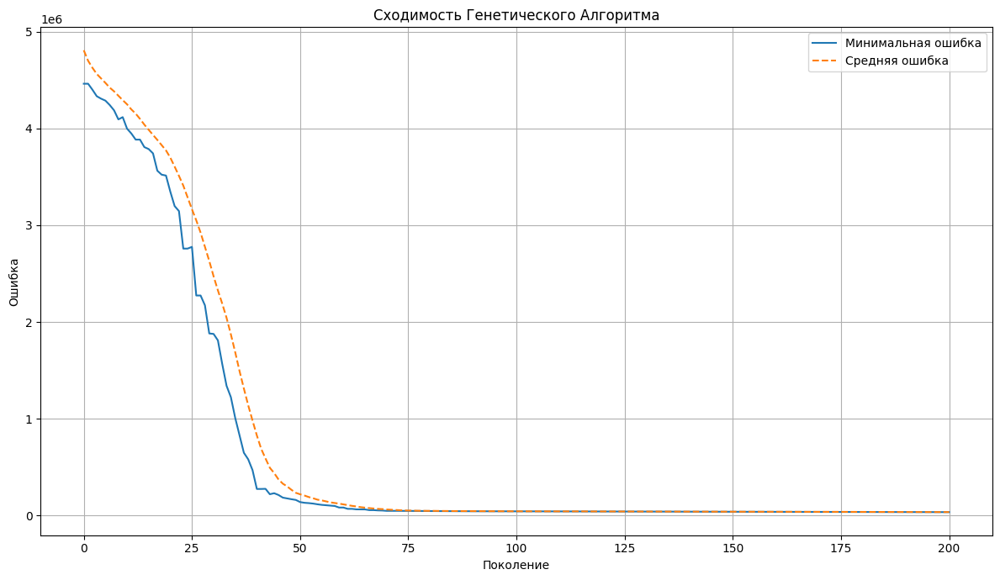

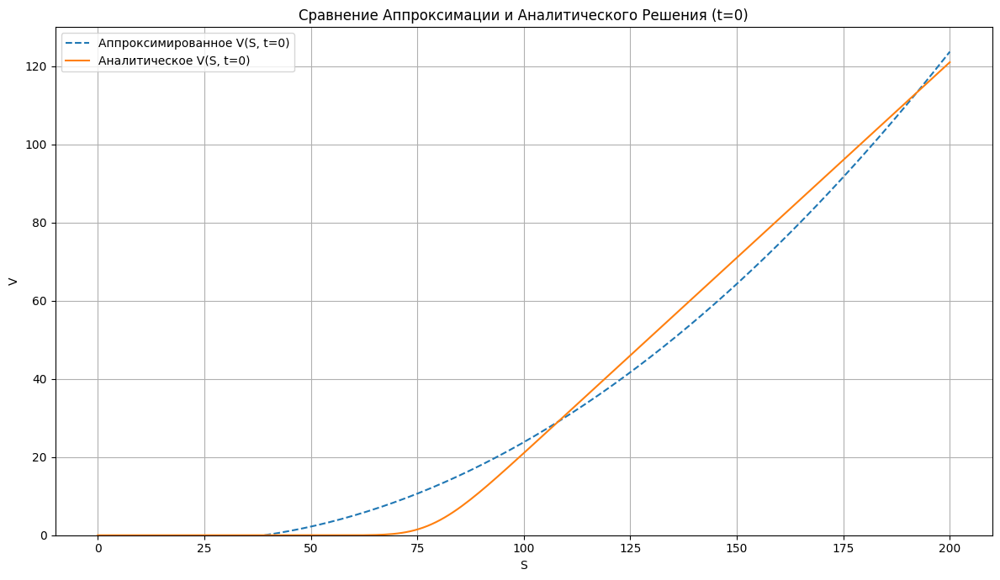


Цена опциона по модели ГА+BFGS при S=100.0, t=0.0: 23.799611
Аналитическая цена опциона (Black–Scholes) при S=100.0, t=0.0: 21.021298
Абсолютная ошибка: 2.778312

Финальные оптимизированные параметры:
[-4.90871707e-01 -2.70166305e+01  1.51195190e+02 -4.87717987e-03
 -1.75236492e-02 -3.34096866e+00]


In [9]:
# @title ГА для уравнения Блэка-Шоулза
# np.random.seed = 30
class OptionConfig:
    def __init__(self):
        self.r = 0.05
        self.sigma = 0.2
        self.K = 80
        self.T = 0.25

        self.S_min, self.S_max = 0.0, 200.0
        self.t_min, self.t_max = 0.0, self.T

        self.S_points_num = 70
        self.t_points_num = 50


class GAConfig:
    def __init__(self):
        self.POP_SIZE = 350
        self.GENERATIONS = 200
        self.MUT_RATE = 0.1
        self.CX_RATE = 0.6
        self.NUM_PARAMS = 6


class LossConfig:
    def __init__(self):
        self.eq_weight = 5.0
        self.bc_weight = 5.0
        self.term_weight = 5.0
        self.reg_lambda = 0.001


def normalize(S, t, option_cfg):
    S_norm = (S - option_cfg.S_min) / (option_cfg.S_max - option_cfg.S_min)
    t_norm = (t - option_cfg.t_min) / (option_cfg.t_max - option_cfg.t_min)
    return S_norm, t_norm


def model(params, S, t, option_cfg):
    S_norm, t_norm = normalize(S, t, option_cfg)
    a0, a1, a2, a3, a4, a5 = params
    return a0 + a1 * S_norm + a2 * S_norm ** 2 + a3 * t_norm + a4 * S_norm * t_norm + a5 * S_norm ** 2 * t_norm


def calculate_derivatives(params, S_norm, t_norm, option_cfg):
    a0, a1, a2, a3, a4, a5 = params
    dVdt_norm = a3 + a4 * S_norm + a5 * S_norm ** 2
    dVdS_norm = a1 + 2 * a2 * S_norm + a4 * t_norm + 2 * a5 * S_norm * t_norm
    d2VdS2_norm = 2 * a2 + 2 * a5 * t_norm
    dS_scale = option_cfg.S_max - option_cfg.S_min
    dt_scale = option_cfg.T - option_cfg.t_min
    dVdt = dVdt_norm / dt_scale
    dVdS = dVdS_norm / dS_scale
    d2VdS2 = d2VdS2_norm / dS_scale ** 2
    return dVdt, dVdS, d2VdS2


def black_scholes_residual_vectorized(params, option_cfg, loss_cfg, S_points, t_points):
    total_error = 0.0
    S_mesh, t_mesh = np.meshgrid(S_points, t_points)
    S_norm_mesh, t_norm_mesh = normalize(S_mesh, t_mesh, option_cfg)
    V_model_mesh = model(params, S_mesh, t_mesh, option_cfg)
    dVdt, dVdS, d2VdS2 = calculate_derivatives(params, S_norm_mesh, t_norm_mesh, option_cfg)
    bs_residual = dVdt + 0.5 * option_cfg.sigma ** 2 * S_mesh ** 2 * d2VdS2 + option_cfg.r * S_mesh * dVdS - option_cfg.r * V_model_mesh
    mask_not_at_T = ~np.isclose(t_mesh, option_cfg.T)
    total_error += loss_cfg.eq_weight * np.sum(bs_residual[mask_not_at_T] ** 2)

    t_terminal_idx = np.isclose(t_points, option_cfg.T)
    if np.any(t_terminal_idx):
        V_model_terminal = V_model_mesh[t_terminal_idx,:].flatten()
        S_terminal = S_mesh[t_terminal_idx, :].flatten()
        V_true_terminal = np.maximum(S_terminal - option_cfg.K, 0)
        total_error += loss_cfg.term_weight * np.sum((V_model_terminal - V_true_terminal) ** 2)

    s_min_idx = np.isclose(S_points, option_cfg.S_min)
    if np.any(s_min_idx):
        V_model_S_min = V_model_mesh[:, s_min_idx].flatten()
        total_error += loss_cfg.bc_weight * np.sum(V_model_S_min ** 2)

    s_max_idx = np.isclose(S_points, option_cfg.S_max)
    if np.any(s_max_idx):
        V_model_S_max = V_model_mesh[:, s_max_idx].flatten()
        t_for_S_max = t_mesh[:, s_max_idx].flatten()
        V_true_S_max = S_points[s_max_idx] - option_cfg.K * np.exp(-option_cfg.r * (option_cfg.T - t_for_S_max))
        total_error += loss_cfg.bc_weight * np.sum((V_model_S_max - V_true_S_max) ** 2)

    total_error += loss_cfg.reg_lambda * np.sum(np.array(params) ** 2)

    return total_error,


def bs_analytic(S, t, K, r, sigma, T):
    tau = T - t
    S = np.maximum(S, 1e-8)
    is_at_expiration = (tau < 1e-9)
    value_at_expiration = np.maximum(S - K, 0)
    sqrt_tau = np.sqrt(np.where(tau > 1e-9, tau, 1e-9))
    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * tau) / (sigma * sqrt_tau)
    d2 = d1 - sigma * sqrt_tau
    option_price = np.where(is_at_expiration, value_at_expiration, S * norm.cdf(d1) - K * np.exp(-r * tau) * norm.cdf(d2))
    return option_price


def create_toolbox(option_cfg, ga_cfg, loss_cfg, S_points, t_points):
    if not hasattr(creator, "FitnessMin"):
        creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
    if not hasattr(creator, "Individual"):
        creator.create("Individual", np.ndarray, fitness=creator.FitnessMin)
    toolbox = base.Toolbox()
    toolbox.register("attr_float", np.random.uniform, -1.0, 1.0)
    toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=ga_cfg.NUM_PARAMS)
    toolbox.register("population", tools.initRepeat, list, toolbox.individual)
    toolbox.register("evaluate", black_scholes_residual_vectorized, option_cfg=option_cfg, loss_cfg=loss_cfg, S_points=S_points, t_points=t_points)
    toolbox.register("mate", tools.cxBlend, alpha=0.5)
    toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.2, indpb=ga_cfg.MUT_RATE)
    toolbox.register("select", tools.selTournament, tournsize=3)
    return toolbox


def run_genetic_algorithm(toolbox: base.Toolbox, ga_cfg: GAConfig):
    """Запускает генетический алгоритм."""
    population = toolbox.population(n=ga_cfg.POP_SIZE)
    hof = tools.HallOfFame(1)

    def similar(a, b):
        return np.allclose(a, b)

    hof.similar = similar

    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", np.mean)
    stats.register("min", np.min)

    population, logbook = algorithms.eaSimple(population, toolbox,
                                            cxpb=ga_cfg.CX_RATE,
                                            mutpb=ga_cfg.MUT_RATE,
                                            ngen=ga_cfg.GENERATIONS,
                                            stats=stats,
                                            halloffame=hof,
                                            verbose=True)
    return hof[0], logbook


if __name__ == "__main__":
    option_cfg = OptionConfig()
    ga_cfg = GAConfig()
    loss_cfg = LossConfig()
    S_points = np.linspace(option_cfg.S_min, option_cfg.S_max, option_cfg.S_points_num)
    t_points = np.linspace(option_cfg.t_min, option_cfg.t_max, option_cfg.t_points_num)

    toolbox = create_toolbox(option_cfg, ga_cfg, loss_cfg, S_points, t_points)
    best_params_ga, logbook = run_genetic_algorithm(toolbox, ga_cfg)
    print(f"\nЛучшие параметры после ГА: {best_params_ga}")
    print(f"Ошибка после ГА: {best_params_ga.fitness.values[0]:.6f}")

    res = minimize(black_scholes_residual_vectorized, best_params_ga,
                   args=(option_cfg, loss_cfg, S_points, t_points),
                   method='BFGS',
                   options={'disp': True, 'maxiter': 1000})
    # res = basinhopping(black_scholes_residual_vectorized,best_params_ga,minimizer_kwargs={"args": (option_cfg, loss_cfg, S_points, t_points), "method": "BFGS"})
    optimized_params = res.x
    final_error = res.fun
    print(f"\nОптимизированные параметры: {optimized_params}")
    print(f"Финальная ошибка после BFGS: {final_error:.6f}")

    # Визуализация сходимости
    gen = logbook.select("gen")
    min_errors = logbook.select("min")
    avg_errors = logbook.select("avg")
    plt.figure(figsize=(12, 7))
    plt.plot(gen, min_errors, label='Минимальная ошибка')
    plt.plot(gen, avg_errors, label='Средняя ошибка', linestyle='--')
    plt.xlabel('Поколение')
    plt.ylabel('Ошибка')
    plt.title('Сходимость Генетического Алгоритма')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Сравнение решений при t=0
    S_grid_for_plot = np.linspace(option_cfg.S_min, option_cfg.S_max, 200)
    t_fixed = 0.0
    V_approx = model(optimized_params, S_grid_for_plot, t_fixed, option_cfg)
    V_exact = bs_analytic(S_grid_for_plot, t_fixed, option_cfg.K, option_cfg.r, option_cfg.sigma, option_cfg.T)
    plt.figure(figsize=(12, 7))
    plt.plot(S_grid_for_plot, V_approx, label='Аппроксимированное V(S, t=0)', linestyle='--')
    plt.plot(S_grid_for_plot, V_exact, label='Аналитическое V(S, t=0)', linestyle='-')
    plt.xlabel('S')
    plt.ylabel('V')
    plt.title('Сравнение Аппроксимации и Аналитического Решения (t=0)')
    plt.legend()
    plt.grid(True)
    plt.ylim(bottom=0)
    plt.tight_layout()
    plt.show()

    S_check = 100.0
    t_check = 0.0

    V_approx_value = model(optimized_params, S_check, t_check, option_cfg)
    V_exact_value = bs_analytic(S_check, t_check, option_cfg.K, option_cfg.r, option_cfg.sigma, option_cfg.T)

    print(f"\nЦена опциона по модели ГА+BFGS при S={S_check}, t={t_check}: {V_approx_value:.6f}")
    print(f"Аналитическая цена опциона (Black–Scholes) при S={S_check}, t={t_check}: {V_exact_value:.6f}")
    print(f"Абсолютная ошибка: {abs(V_approx_value - V_exact_value):.6f}")



    print("\nФинальные оптимизированные параметры:")
    print(optimized_params)

Epoch 0, Loss: 1682.181274
Epoch 500, Loss: 1127.729858
Epoch 1000, Loss: 451.191254
Epoch 1500, Loss: 342.115784
Epoch 2000, Loss: 147.721603
Epoch 2500, Loss: 76.029297
Epoch 3000, Loss: 58.409271
Epoch 3500, Loss: 41.594692
Epoch 4000, Loss: 18.537369
Epoch 4500, Loss: 6.637562
Предсказанное рещение PINN S=100, t=0: 10.198812
Аналитическая цена Блэка-Шоулза S=100, t=0: 10.450584


<ipython-input-10-ccdc328e9ef1>:98: RuntimeWarning: divide by zero encountered in log
  d1 = (np.log(S / K) + (r + 0.5 * sigma**2)*tau) / (sigma * np.sqrt(tau))


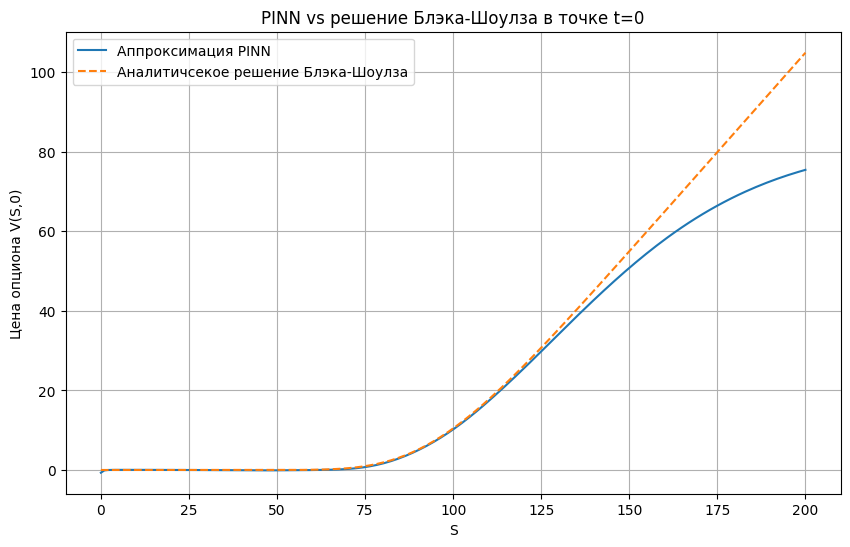

In [10]:
# @title PINN для уравнения Блэка-Шоулза
import torch
import torch.nn as nn
import torch.autograd as autograd

class OptionConfig:
    def __init__(self):
        self.r = 0.05
        self.sigma = 0.2
        self.K = 100
        self.T = 1.0
        self.S_min, self.S_max = 0.0, 200.0
        self.t_min, self.t_max = 0.0, self.T

option_cfg = OptionConfig()

class PINN(nn.Module):
    def __init__(self, layers):
        super(PINN, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(len(layers)-1):
            self.layers.append(nn.Linear(layers[i], layers[i+1]))
        self.activation = nn.Tanh()

    def forward(self, x):
        for i in range(len(self.layers)-1):
            x = self.activation(self.layers[i](x))
        x = self.layers[-1](x)
        return x


def loss_pinn(model, S, t):
    S.requires_grad_(True)
    t.requires_grad_(True)

    inputs = torch.cat([S, t], dim=1)
    V = model(inputs)

    V_t = autograd.grad(V, t, grad_outputs=torch.ones_like(V), create_graph=True)[0]
    V_S = autograd.grad(V, S, grad_outputs=torch.ones_like(V), create_graph=True)[0]
    V_SS = autograd.grad(V_S, S, grad_outputs=torch.ones_like(V_S), create_graph=True)[0]

    r = option_cfg.r
    sigma = option_cfg.sigma

    pde = V_t + 0.5 * sigma**2 * S**2 * V_SS + r * S * V_S - r * V

    mask_T = (t == option_cfg.T)
    payoff = torch.clamp(S - option_cfg.K, min=0.0)
    loss_pde = torch.mean(pde[~mask_T]**2)
    if mask_T.any():
        loss_bc = torch.mean((V[mask_T] - payoff[mask_T])**2)
    else:
        loss_bc = torch.tensor(0.0)

    return loss_pde + loss_bc


def generate_training_points(N):
    S = torch.FloatTensor(N,1).uniform_(option_cfg.S_min, option_cfg.S_max)
    t = torch.FloatTensor(N,1).uniform_(option_cfg.t_min, option_cfg.t_max)
    S_bc = torch.FloatTensor(N//10,1).uniform_(option_cfg.S_min, option_cfg.S_max)
    t_bc = torch.full((N//10,1), option_cfg.T)
    S = torch.cat([S, S_bc], dim=0)
    t = torch.cat([t, t_bc], dim=0)
    return S, t


model = PINN([2, 32, 32, 32, 1])
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Обучение
epochs = 5000
N_train = 1000

for epoch in range(epochs):
    optimizer.zero_grad()
    S_train, t_train = generate_training_points(N_train)
    loss = loss_pinn(model, S_train, t_train)
    loss.backward()
    optimizer.step()
    if epoch % 500 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.6f}")

model.eval()
with torch.no_grad():
    S_test = torch.tensor([[100.0]])
    t_test = torch.tensor([[0.0]])
    V_pred = model(torch.cat([S_test, t_test], dim=1)).item()
    print(f"Предсказанное рещение PINN S=100, t=0: {V_pred:.6f}")

# Сравнение с аналитикой
from scipy.stats import norm
def bs_analytic(S, t, K, r, sigma, T):
    tau = T - t
    if tau < 1e-9:
        return max(S-K, 0)
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2)*tau) / (sigma * np.sqrt(tau))
    d2 = d1 - sigma*np.sqrt(tau)
    return S*norm.cdf(d1) - K*np.exp(-r*tau)*norm.cdf(d2)

V_exact = bs_analytic(100, 0, option_cfg.K, option_cfg.r, option_cfg.sigma, option_cfg.T)
print(f"Аналитическая цена Блэка-Шоулза S=100, t=0: {V_exact:.6f}")

S_vals = np.linspace(option_cfg.S_min, option_cfg.S_max, 200)
t_fixed = 0.0
with torch.no_grad():
    inputs = torch.tensor(np.column_stack((S_vals, np.full_like(S_vals, t_fixed))), dtype=torch.float32)
    V_pinn = model(inputs).numpy()
V_bs = np.array([bs_analytic(s, t_fixed, option_cfg.K, option_cfg.r, option_cfg.sigma, option_cfg.T) for s in S_vals])

plt.figure(figsize=(10,6))
plt.plot(S_vals, V_pinn, label='Аппроксимация PINN')
plt.plot(S_vals, V_bs, label='Аналитичсекое решение Блэка-Шоулза', linestyle='--')
plt.xlabel('S')
plt.ylabel('Цена опциона V(S,0)')
plt.legend()
plt.title('PINN vs решение Блэка-Шоулза в точке t=0')
plt.grid(True)
plt.show()
